In [1]:
import csv
import numpy as np
import pandas as pd
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
prosody_data = pd.read_csv('Prosody_Data_M1.csv')

In [3]:
prosody_data.head()

,participant&question,duration,energy,power,min_pitch,max_pitch,mean_pitch,pitch_sd,pitch_abs,pitch_quant,...,TotDurPause:3,iInterval,MaxRising:3,MaxFalling:3,AvgTotRis:3,AvgTotFall:3,numRising,numFall,RecommendHiring,Hired
0,P1Q1,51.952125,0.015331,0.000295,75.232657,396.635613,127.989222,27.821528,217.628692,119.690367,...,27.176,138,274.562,257.247,25.872,20.106,91,4722.964842,5.106224,0
1,P1Q2,38.677312,0.015185,0.000393,75.165527,397.613041,131.067490,26.452853,195.852246,124.820583,...,20.875,100,268.613,270.193,24.647,15.886,71,2928.482587,5.106224,0
2,P1Q3,43.593896,0.014680,0.000337,71.034761,395.930688,127.739086,26.006330,189.441736,120.457847,...,22.229,114,283.912,203.506,23.720,16.951,79,3528.448990,5.106224,0
3,P1Q4,23.435813,0.008920,0.000381,74.938673,248.733738,129.563914,19.334327,103.024640,124.473851,...,12.171,55,100.655,83.172,13.148,5.044,36,1924.546685,5.106224,0
4,P1Q5,13.274833,0.003432,0.000259,93.949854,263.669188,130.178482,26.595483,174.934601,120.272480,...,7.541,32,129.591,117.119,14.706,11.073,19,1322.366516,5.106224,0


In [4]:
prosody_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 680 entries, 0 to 679
Data columns (total 61 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   participant&question  680 non-null    object 
 1   duration              680 non-null    float64
 2   energy                680 non-null    float64
 3   power                 680 non-null    float64
 4   min_pitch             680 non-null    float64
 5   max_pitch             680 non-null    float64
 6   mean_pitch            680 non-null    float64
 7   pitch_sd              680 non-null    float64
 8   pitch_abs             680 non-null    float64
 9   pitch_quant           680 non-null    float64
 10  pitchUvsVRatio        680 non-null    float64
 11  Time:8                680 non-null    float64
 12  iDifference           680 non-null    float64
 13  diffPitchMaxMin       680 non-null    float64
 14  diffPitchMaxMean      680 non-null    float64
 15  diffPitchMaxMode      6

In [5]:
x1 = prosody_data['energy']
x2 = prosody_data['speakRate']
x3 = prosody_data['avgBand1']
yH = prosody_data['RecommendHiring']
cH = prosody_data['Hired']

Text(0.5, 0, 'RecommendHiring')

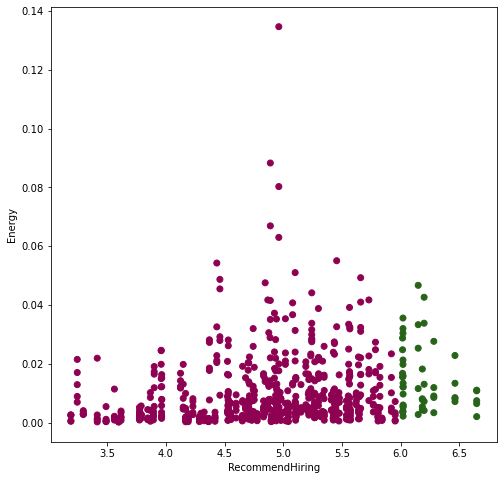

In [6]:

# Creating plot
fig = plt.figure(figsize=(8,8))


ax = plt.axes()

#Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis mako_r
plt.scatter(yH,x1, c=cH, cmap= 'PiYG')
plt.ylabel('Energy')
plt.xlabel('RecommendHiring')

Text(0.5, 0, 'RecommendHiring')

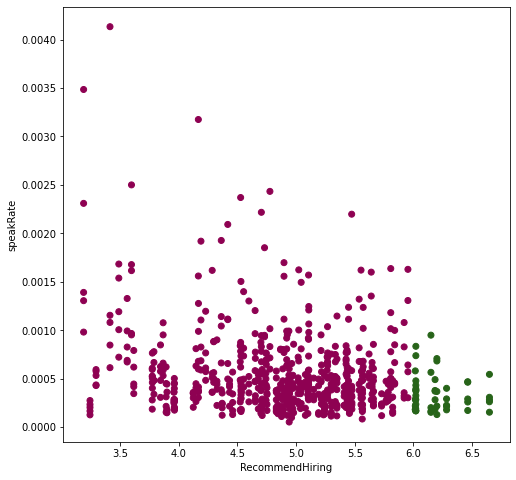

In [7]:
fig = plt.figure(figsize=(8,8))
ax = plt.axes()
plt.scatter(yH,x2, c=cH, cmap= 'PiYG')
plt.ylabel('speakRate')
plt.xlabel('RecommendHiring')

Text(0.5, 0, 'RecommendHiring')

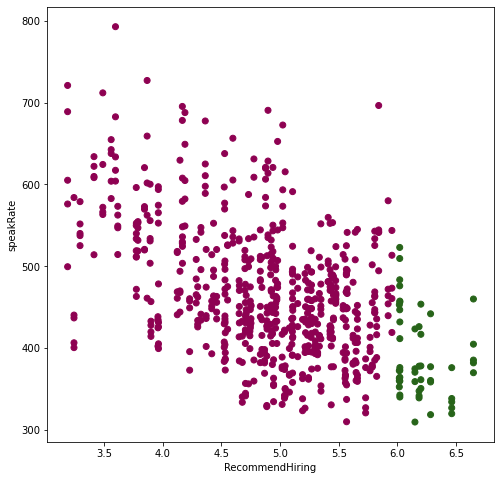

In [8]:
fig = plt.figure(figsize=(8,8))
ax = plt.axes()
plt.scatter(yH,x3, c=cH, cmap= 'PiYG')
plt.ylabel('speakRate')
plt.xlabel('RecommendHiring')

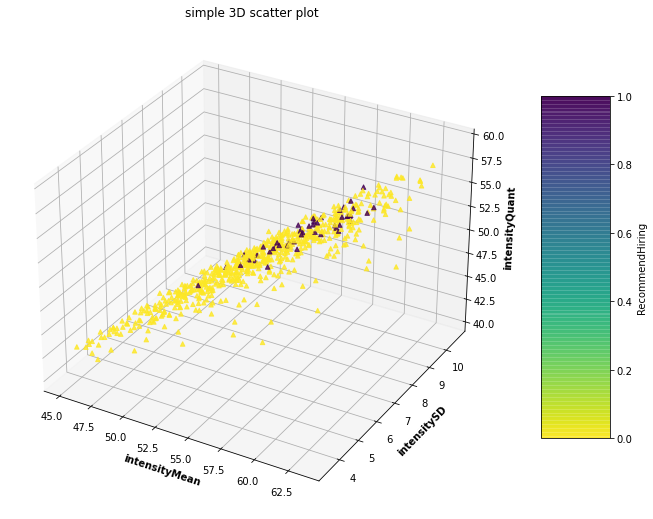

In [9]:
# Creating dataset
z = prosody_data['intensityQuant']
x = prosody_data['intensityMean']
y = prosody_data['intensitySD']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map 
my_cmap = plt.get_cmap('viridis_r')

# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = cH,
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('intensityMean', fontweight ='bold')
ax.set_ylabel('intensitySD', fontweight ='bold')
ax.set_zlabel('intensityQuant', fontweight ='bold')
fig.colorbar(sctt, shrink = 0.7,label = 'RecommendHiring', aspect = 5)

# show plot


plt.show()

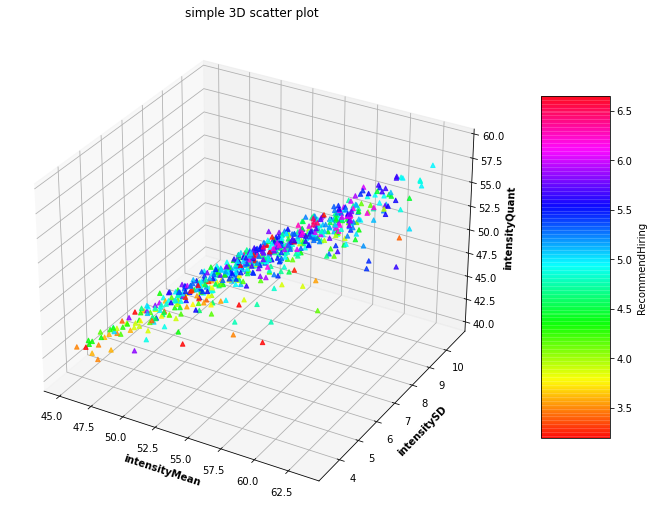

In [10]:
# Creating dataset
z = prosody_data['intensityQuant']
x = prosody_data['intensityMean']
y = prosody_data['intensitySD']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map 
my_cmap = plt.get_cmap('hsv')

# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = yH,
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('intensityMean', fontweight ='bold')
ax.set_ylabel('intensitySD', fontweight ='bold')
ax.set_zlabel('intensityQuant', fontweight ='bold')
fig.colorbar(sctt, shrink = 0.7,label = 'RecommendHiring', aspect = 5)

# show plot


plt.show()

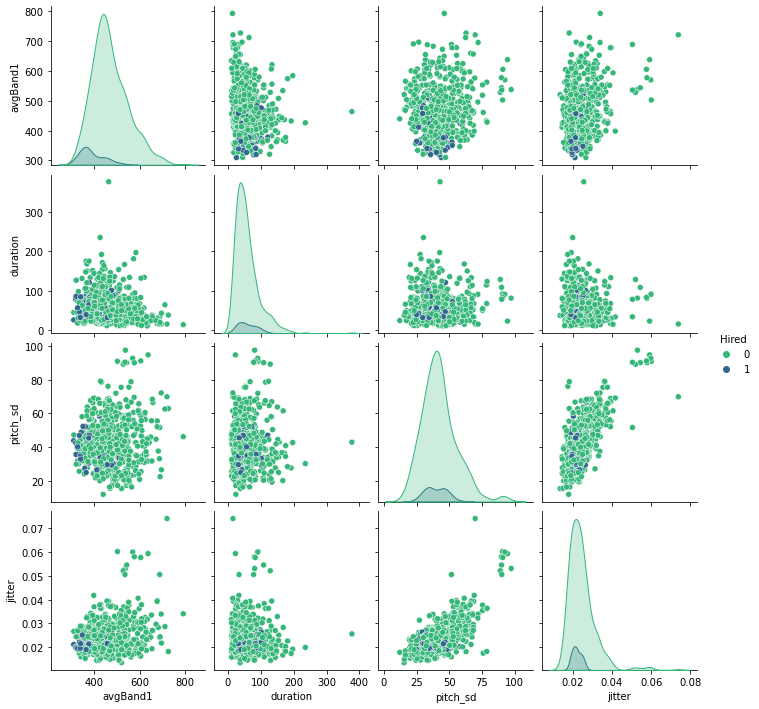

In [11]:
df1=prosody_data[['avgBand1', 'duration', 'pitch_sd', 'jitter','Hired']]
sns.pairplot(df1,hue='Hired',palette='viridis_r')

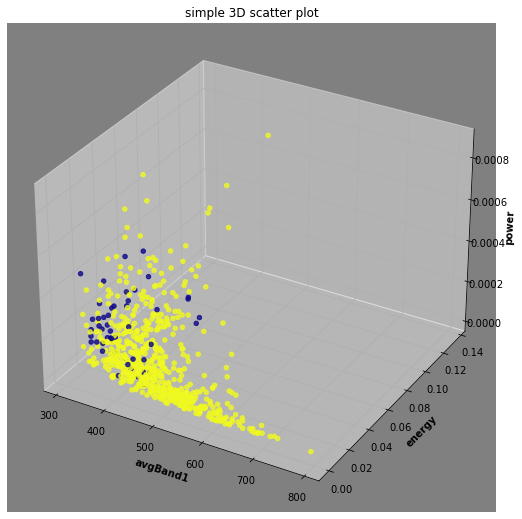

Text(0.5, 0, 'Energy')

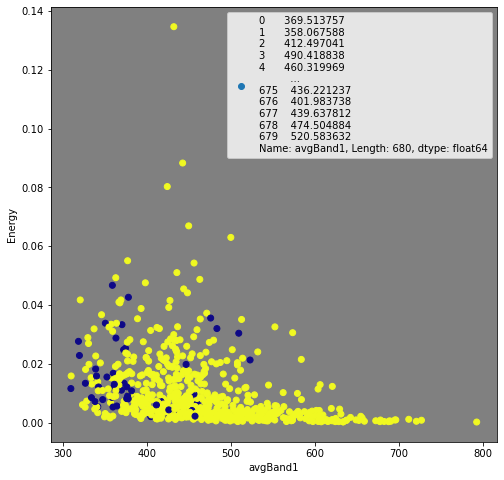

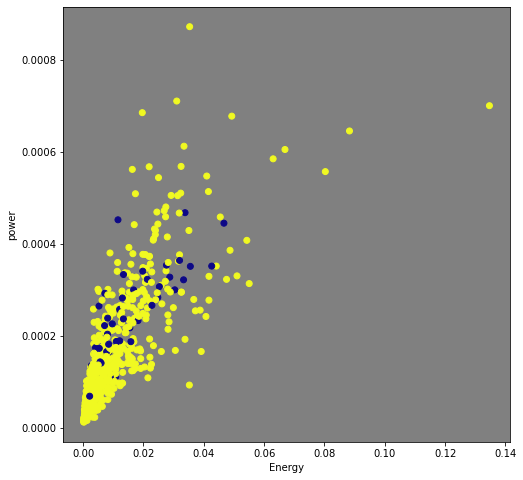

In [12]:
x = prosody_data['avgBand1']
y = prosody_data['energy']
z = prosody_data['power']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = cH,
                    cmap = my_cmap,
                    marker ='o')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('avgBand1', fontweight ='bold')
ax.set_ylabel('energy', fontweight ='bold')
ax.set_zlabel('power', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(x, y, c=cH, cmap= 'plasma_r',label=x)
plt.ylabel('Energy')
plt.xlabel('avgBand1')
plt.legend()


fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(y, z, c=cH, cmap= 'plasma_r')
plt.ylabel('power')
plt.xlabel('Energy')


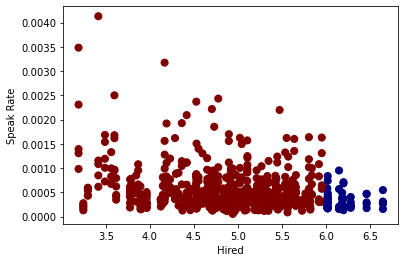

In [13]:
plt.scatter(yH,x2,c=cH, cmap= 'jet_r',s=50)
plt.ylabel('Speak Rate')
plt.xlabel('Hired')
plt.show()

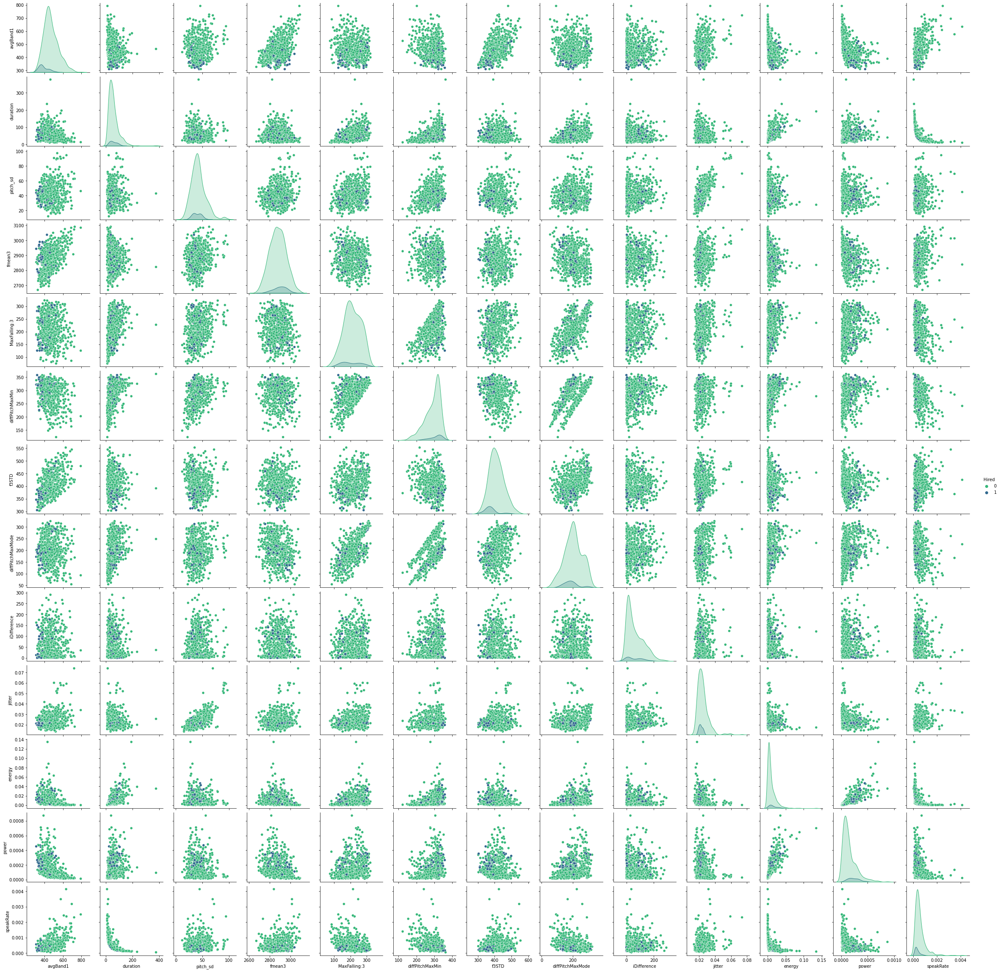

In [22]:
df1=prosody_data[['avgBand1', 'duration', 'pitch_sd', 'fmean3', 'MaxFalling:3', 'diffPitchMaxMin', 'f3STD', 'diffPitchMaxMode', 'iDifference', 'jitter','energy','power','speakRate','Hired']]
sns.pairplot(df1,hue='Hired',palette='viridis_r')

In [23]:
cor = df1.corr()
cor.style.background_gradient(cmap="coolwarm").set_precision(2)

,avgBand1,duration,pitch_sd,fmean3,MaxFalling:3,diffPitchMaxMin,f3STD,diffPitchMaxMode,iDifference,jitter,energy,power,speakRate,Hired
avgBand1,1.00,-0.17,0.15,0.50,-0.09,-0.25,0.51,-0.07,0.01,0.29,-0.34,-0.47,0.50,-0.26
duration,-0.17,1.00,-0.01,-0.07,0.41,0.37,0.07,0.39,-0.06,-0.03,0.64,0.22,-0.59,0.01
pitch_sd,0.15,-0.01,1.00,0.23,0.25,0.33,-0.02,0.05,0.14,0.69,-0.07,-0.07,0.17,-0.05
fmean3,0.50,-0.07,0.23,1.00,-0.08,-0.06,-0.06,-0.22,0.03,0.20,-0.17,-0.26,0.23,0.08
MaxFalling:3,-0.09,0.41,0.25,-0.08,1.00,0.53,0.18,0.65,0.09,0.23,0.31,0.18,-0.30,-0.03
diffPitchMaxMin,-0.25,0.37,0.33,-0.06,0.53,1.00,-0.14,0.59,0.09,0.10,0.29,0.23,-0.41,0.11
f3STD,0.51,0.07,-0.02,-0.06,0.18,-0.14,1.00,0.37,-0.03,0.21,0.01,-0.06,0.12,-0.21
diffPitchMaxMode,-0.07,0.39,0.05,-0.22,0.65,0.59,0.37,1.00,-0.01,0.15,0.33,0.25,-0.30,-0.07
iDifference,0.01,-0.06,0.14,0.03,0.09,0.09,-0.03,-0.01,1.00,0.08,-0.03,-0.01,0.02,-0.02
jitter,0.29,-0.03,0.69,0.20,0.23,0.10,0.21,0.15,0.08,1.00,-0.14,-0.18,0.26,-0.09


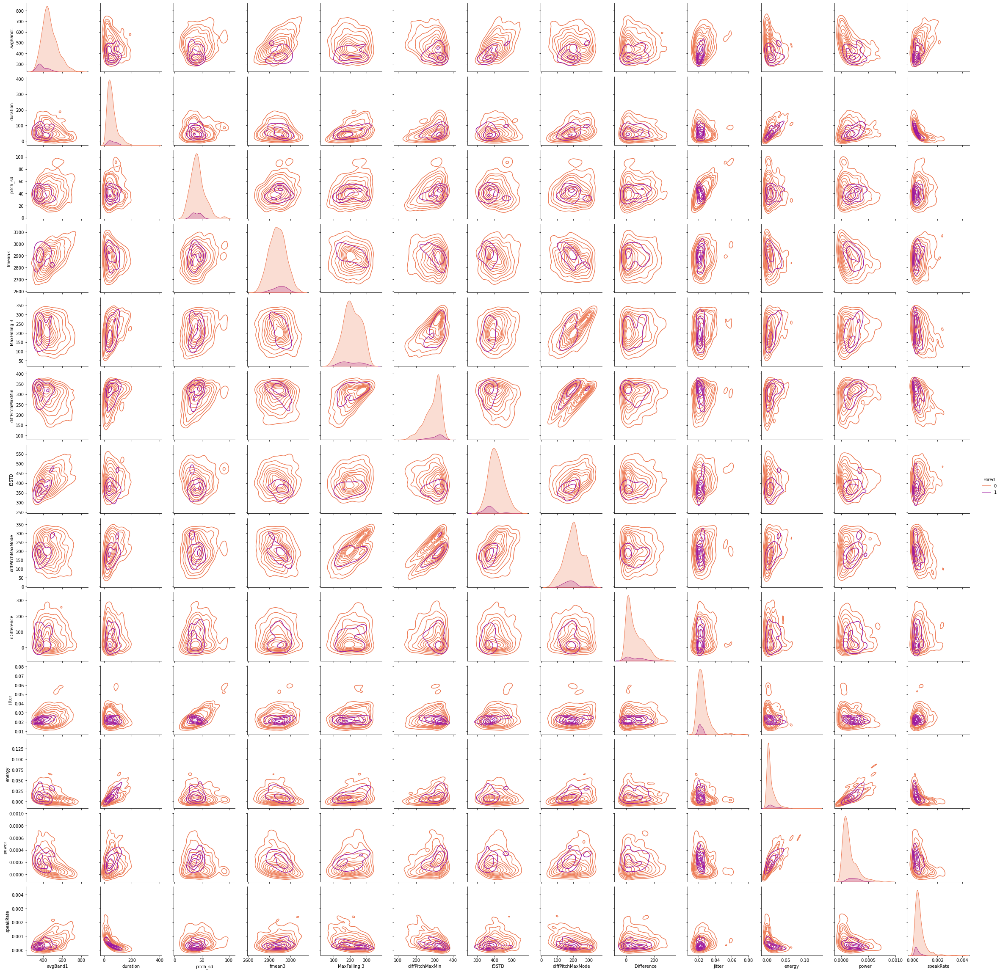

In [30]:
df1=prosody_data[['avgBand1', 'duration', 'pitch_sd', 'fmean3', 'MaxFalling:3', 'diffPitchMaxMin', 'f3STD', 'diffPitchMaxMode', 'iDifference', 'jitter','energy','power','speakRate','Hired']]
sns.pairplot(df1,hue='Hired',kind='kde',palette='plasma_r')
#kind{‘scatter’, ‘kde’, ‘hist’, ‘reg’}

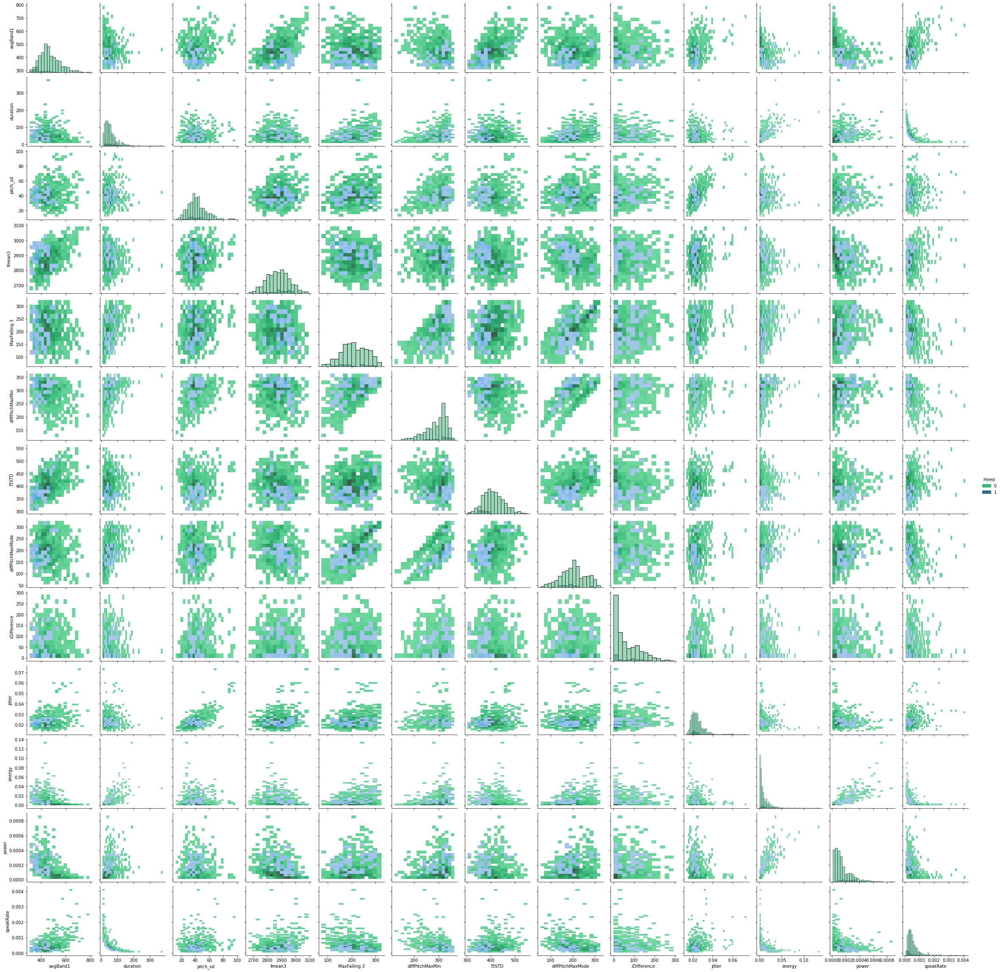

In [27]:
df1=prosody_data[['avgBand1', 'duration', 'pitch_sd', 'fmean3', 'MaxFalling:3', 'diffPitchMaxMin', 'f3STD', 'diffPitchMaxMode', 'iDifference', 'jitter','energy','power','speakRate','Hired']]
sns.pairplot(df1,hue='Hired',kind='hist',palette='viridis_r')

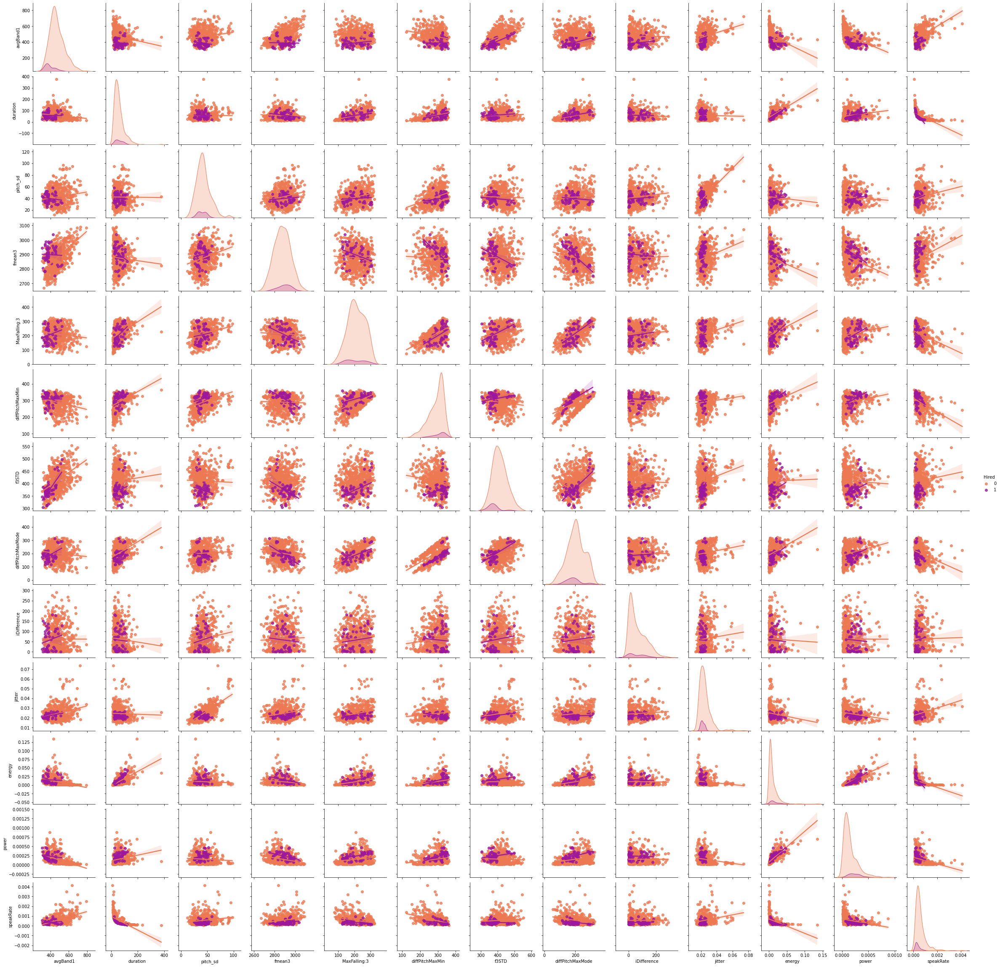

In [29]:
df1=prosody_data[['avgBand1', 'duration', 'pitch_sd', 'fmean3', 'MaxFalling:3', 'diffPitchMaxMin', 'f3STD', 'diffPitchMaxMode', 'iDifference', 'jitter','energy','power','speakRate','Hired']]
sns.pairplot(df1,hue='Hired',kind='reg',palette='plasma_r')

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility)

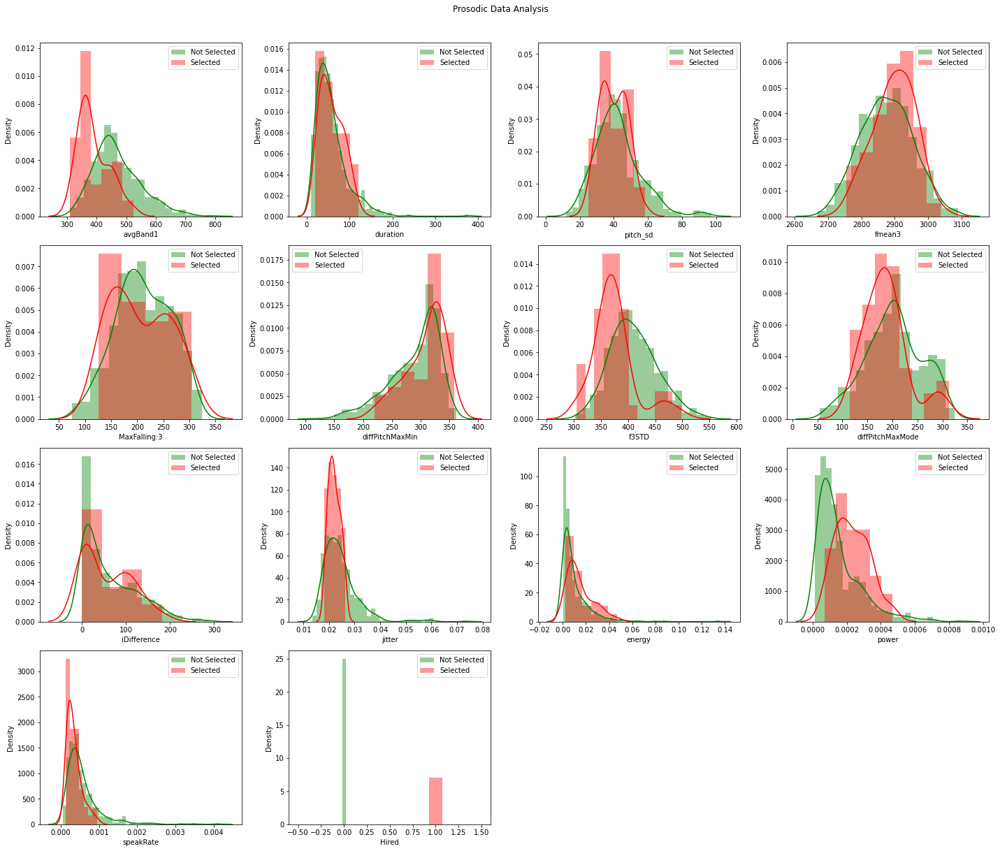

In [32]:
fig = plt.figure(figsize = (20, 25))
j = 0
for i in df1.columns:
    plt.subplot(6, 4, j+1)
    j += 1
    sns.distplot(df1[i][prosody_data['Hired']==0], color='g', label = 'Not Selected')
    sns.distplot(df1[i][prosody_data['Hired']==1], color='r', label = 'Selected')
    plt.legend(loc='best')
fig.suptitle('Prosodic Data Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

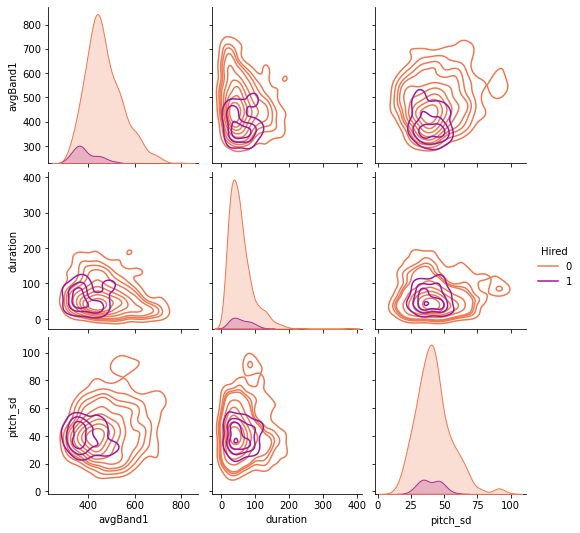

In [35]:
df2=prosody_data[['avgBand1', 'duration', 'pitch_sd','Hired']]
sns.pairplot(df1,hue='Hired',kind='kde',palette='plasma_r')
#kind{‘scatter’, ‘kde’, ‘hist’, ‘reg’}

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility)

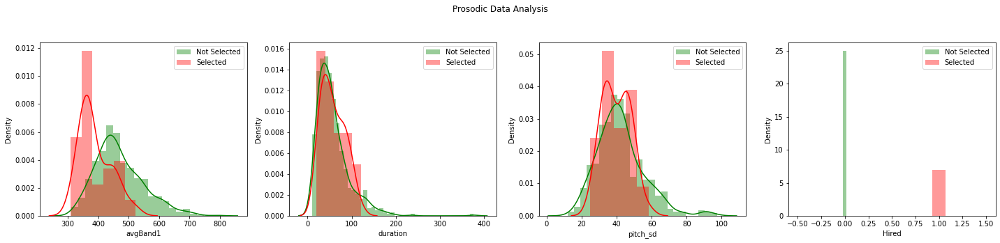

In [36]:
fig = plt.figure(figsize = (20, 25))
j = 0
for i in df1.columns:
    plt.subplot(6, 4, j+1)
    j += 1
    sns.distplot(df2[i][prosody_data['Hired']==0], color='g', label = 'Not Selected')
    sns.distplot(df2[i][prosody_data['Hired']==1], color='r', label = 'Selected')
    plt.legend(loc='best')
fig.suptitle('Prosodic Data Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

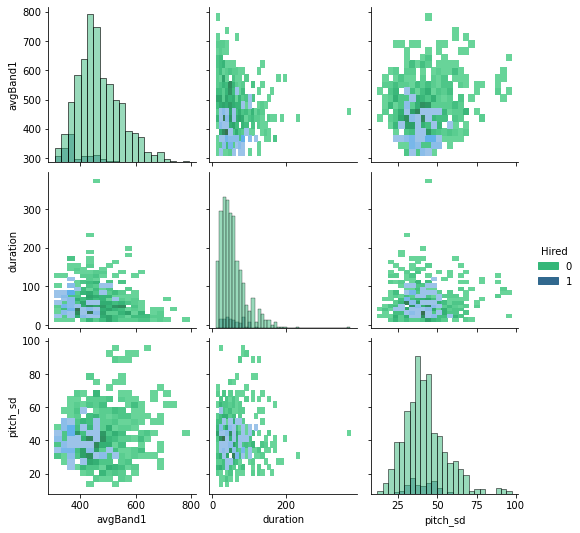

In [40]:
sns.pairplot(df2,hue='Hired',kind='hist',palette='viridis_r')

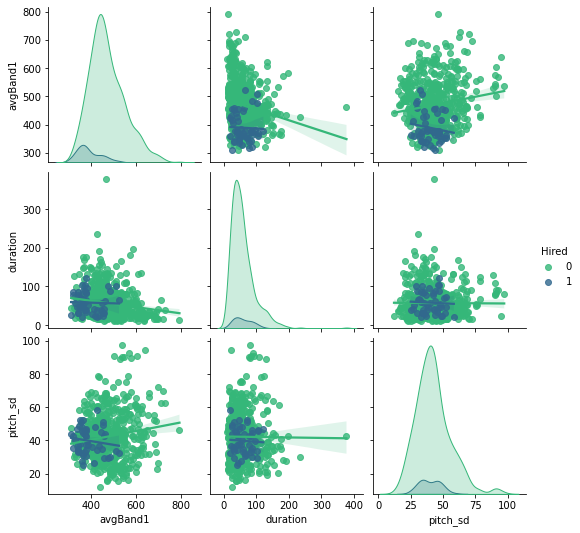

In [41]:
sns.pairplot(df2,hue='Hired',kind='reg',palette='viridis_r')

In [42]:
cor = df2.corr()
cor.style.background_gradient(cmap="coolwarm").set_precision(2)

,avgBand1,duration,pitch_sd,Hired
avgBand1,1.00,-0.17,0.15,-0.26
duration,-0.17,1.00,-0.01,0.01
pitch_sd,0.15,-0.01,1.00,-0.05
Hired,-0.26,0.01,-0.05,1.00
